In [1]:
#Calling --> Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_excel(r'C:\Users\PathOfFile.xlsx', sheet_name='cbarq-pet-owner-data-corrected');

In [3]:
df.head()

,name,dogid,breedid,sex,birthday,weight,isneutered,neuterage,neuteredwhy,whereacquired,...,SnapFlies,TailChase,ShadowChase,Barking,GroomSelf,OtherBehaviors,GroomOthers,date_completed,Unnamed: 166,Unnamed: 167
0,Quest,10170,Irish Wolfhound,male,2006-01-11,140.0,no,0.0,NaN,breeder,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,2008-03-07,NaN,NaN
1,Obi,18281,Border Collie,male,2006-09-25,40.0,yes,0.0,unknown,friend or relative,...,3.0,0.0,NaN,4.0,2.0,NaN,NaN,2008-03-07,NaN,NaN
2,Vico,24234,Golden Retriever,male,2007-10-04,52.0,no,0.0,NaN,breeder,...,0.0,3.0,3.0,2.0,2.0,0.0,2.0,2008-03-25,NaN,NaN
3,Austin,45901,Labrador Retriever,male,2011-01-26,72.0,yes,25.0,unknown,other,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2011-07-18,NaN,NaN
4,Burton,12408,Labrador Retriever,male,2006-03-24,58.0,no,0.0,NaN,breeder,...,3.0,0.0,1.0,1.0,0.0,0.0,2.0,2008-03-07,NaN,NaN


In [4]:
df = df.iloc[: , :-2] # to remove last two columns namely _166, and _167
df = df.drop(['name','dogid','ContactInFuture','EvalType','date_completed', 'healthinfo','mis_92_1','mis_92_2','mis_92_3','mis_92_4','mis_92_5'], axis = 1)

In [5]:
df.shape

(70122, 155)

In [6]:
df.dropna(inplace=True)
print(df.isna().sum().sum())
print(df.shape)

0
(7807, 155)


In [7]:
Non_B_data = df[['breedid', 'sex', 'birthday', 'weight', 'isneutered', 'neuterage', 'neuteredwhy', 'whereacquired', 'ageaquired', 'HealthProblems', 'concerned', 'roles', 'firstowned', 'ownedamt', 'aschild', 'otherdogs', 'otherdogsage', 'Country', 'AgeAtEvaluation', 'Train', 'StrDirAgg', 'OwnDirAgg', 'DogDirAgg', 'FamDogAgg', 'DogDirFear', 'StrDirFear', 'NonSocFear', 'TouchSen', 'SepRelProb', 'Excite', 'AtcAtnSeek', 'Chasing', 'Energy', 'EscapeRoam', 'Rolling', 'Coprophagia', 'Chewing', 'Mounting', 'Begging', 'FoodSteal', 'FearStairs', 'PullLeash', 'MarkUrine', 'SubEmoUrn', 'SepUrn', 'SepDef', 'Hyper', 'Staring', 'SnapFlies', 'TailChase', 'ShadowChase', 'Barking', 'GroomSelf', 'OtherBehaviors', 'GroomOthers']].copy() # drpped columns after behavioural decision only
Non_B_data.shape

(7807, 55)

In [8]:
Non_B_data.head()

,breedid,sex,birthday,weight,isneutered,neuterage,neuteredwhy,whereacquired,ageaquired,HealthProblems,...,SepDef,Hyper,Staring,SnapFlies,TailChase,ShadowChase,Barking,GroomSelf,OtherBehaviors,GroomOthers
3,Labrador Retriever,male,2011-01-26,72.0,yes,25.0,unknown,other,8.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,Labrador Retriever,male,2009-08-17,57.0,yes,25.0,required by breeder,other,8.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
204,Mixed Breed/Unknown,female,2008-11-13,24.0,yes,21.0,recommended by veterinarian,shelter,12.0,0.0,...,4.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
217,Labrador Retriever,female,2009-02-23,33.0,yes,23.0,birth control,friend or relative,8.0,0.0,...,0.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,0.0,0.0
231,Mixed Breed/Unknown,female,2009-07-10,22.0,yes,8.0,required by breeder,breeder,9.0,0.0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0


In [9]:
Non_B_data.to_csv('Clean_Non_Behavioural_DataSet.csv', encoding='utf-8', index= False) # save the dataset in to csv for future work purposes 

K-Mean

In [10]:
data = pd.read_csv(r"C:\Users\yadav\Documents\DogAvtarProject\Behavioral data\Clean_Non_Behavioural_DataSet.csv", encoding='latin-1');

In [11]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

In [12]:
categorical_column_names = []
for column in data.columns:
  if data[column].dtype == "object" or data[column].dtype == "string":
    categorical_column_names.append(column)
print(categorical_column_names)
print(len(categorical_column_names))

['breedid', 'sex', 'birthday', 'isneutered', 'neuteredwhy', 'whereacquired', 'concerned', 'roles', 'firstowned', 'ownedamt', 'aschild', 'otherdogs', 'otherdogsage', 'Country']
14


In [13]:
from sklearn.preprocessing import LabelEncoder
class MultiColumnLabelEncoder:

    def __init__(self,columns = None):
        self.columns = columns # array of column names to encode
    def fit(self,X,y=None):
        return self # not relevant here
    def transform(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in X.
        '''
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output
    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [14]:
dict_column_names = {}
for colName in categorical_column_names:
  dict_column_names[colName] = "string"

print(dict_column_names)
print(len(dict_column_names))

{'breedid': 'string', 'sex': 'string', 'birthday': 'string', 'isneutered': 'string', 'neuteredwhy': 'string', 'whereacquired': 'string', 'concerned': 'string', 'roles': 'string', 'firstowned': 'string', 'ownedamt': 'string', 'aschild': 'string', 'otherdogs': 'string', 'otherdogsage': 'string', 'Country': 'string'}
14


In [15]:
# Convert "Fee" from int to string
string_df = data.astype(dict_column_names)
print(string_df.dtypes)

breedid             string
sex                 string
birthday            string
weight             float64
isneutered          string
neuterage          float64
neuteredwhy         string
whereacquired       string
ageaquired         float64
HealthProblems     float64
concerned           string
roles               string
firstowned          string
ownedamt            string
aschild             string
otherdogs           string
otherdogsage        string
Country             string
AgeAtEvaluation      int64
Train              float64
StrDirAgg          float64
OwnDirAgg          float64
DogDirAgg          float64
FamDogAgg          float64
DogDirFear         float64
StrDirFear         float64
NonSocFear         float64
TouchSen           float64
SepRelProb         float64
Excite             float64
AtcAtnSeek         float64
Chasing            float64
Energy             float64
EscapeRoam         float64
Rolling            float64
Coprophagia        float64
Chewing            float64
M

In [16]:
data_encoded = MultiColumnLabelEncoder(columns = categorical_column_names).fit_transform(string_df)
frame=len(data_encoded)
frame

7807

In [17]:
data_encoded.to_csv('Encoded_NB_Data.csv', encoding='utf-8', index= False) # save the dataset in to csv for future work purposes 

In [18]:
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 30)
#Iterate through for Elbow method
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(data_encoded.values)
    distortions.append(sum(np.min(cdist(data_encoded.values, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / data_encoded.values.shape[0])
    inertias.append(kmeanModel.inertia_)
    mapping1[k] = sum(np.min(cdist(data_encoded.values, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / data_encoded.values.shape[0]
    mapping2[k] = kmeanModel.inertia_

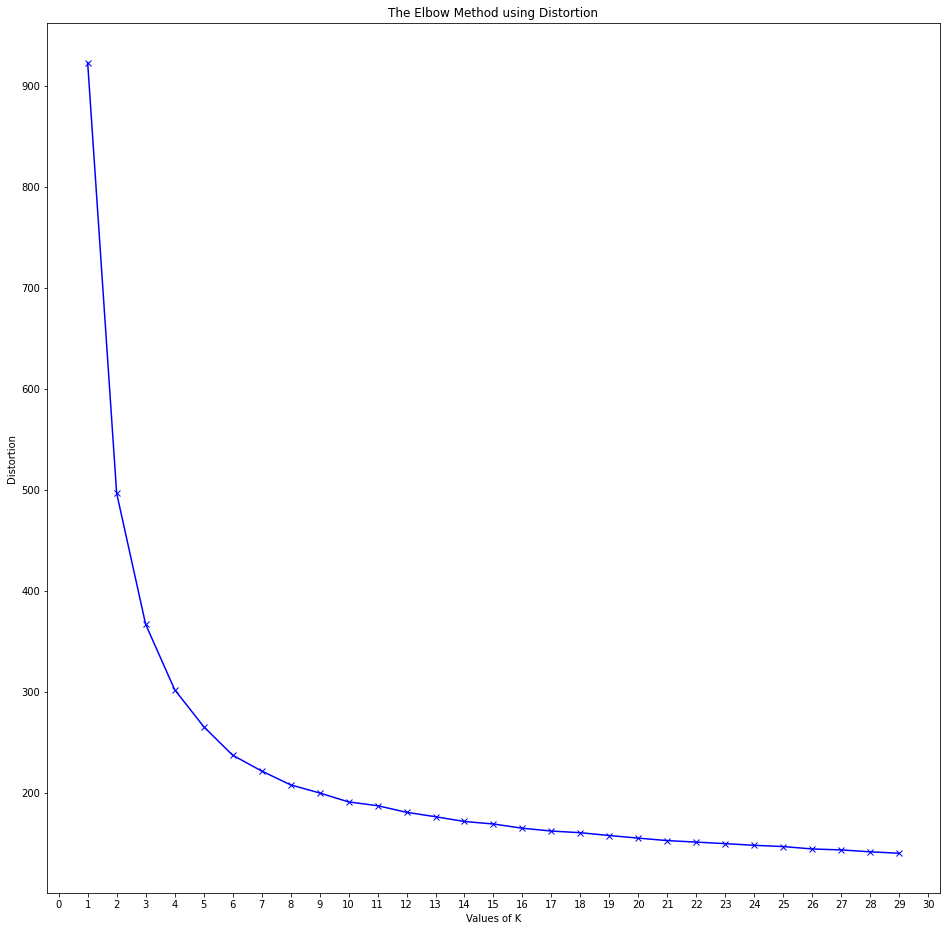

In [19]:
plt.figure(figsize=(16,16))
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.xticks(np.arange(0,31,1))
# plt.savefig('the elbow method result.png', dpi=300)
plt.show()

In [20]:
# data_encoded = data
k=5;

In [21]:
kmeanModel = KMeans(n_clusters=k).fit(data_encoded.values)
kmeanModel.fit(data_encoded.values)
labels=kmeanModel.labels_

In [22]:
X=data_encoded.values
X= data_encoded.loc[:, data.columns]
X["Label"] = kmeanModel.fit_predict(X)
X["Label"] = X["Label"].astype("category")

In [23]:
X.head()

,breedid,sex,birthday,weight,isneutered,neuterage,neuteredwhy,whereacquired,ageaquired,HealthProblems,...,Hyper,Staring,SnapFlies,TailChase,ShadowChase,Barking,GroomSelf,OtherBehaviors,GroomOthers,Label
0,176,1,1921,72.0,0,25.0,7,3,8.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
1,176,1,1587,57.0,0,25.0,6,3,8.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
2,198,0,1408,24.0,0,21.0,5,5,12.0,0.0,...,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3
3,176,0,1468,33.0,0,23.0,0,2,8.0,0.0,...,0.0,0.0,1.0,1.0,1.0,2.0,0.0,0.0,0.0,3
4,198,0,1566,22.0,0,8.0,6,1,9.0,0.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2


In [24]:
X.to_csv('Labeled_Non_Behavioural_data.csv', encoding='utf-8', index= False) # save the dataset in to csv for future work purposes 

Plotting 

In [25]:
import os
from numpy import linalg
from numpy.linalg import norm
from scipy.spatial.distance import squareform, pdist

# Importing sklearn and TSNE.
import sklearn
import plotly 
from sklearn.manifold import TSNE
from sklearn.preprocessing import scale

# We'll hack a bit with the t-SNE code in sklearn.
from sklearn.metrics.pairwise import pairwise_distances

# Random state we define this random state to use this value in TSNE which is a randmized algo.
RS = 761994

# Importing matplotlib for graphics.
import matplotlib.patheffects as PathEffects

# Importing seaborn to make nice plots.
import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

In [26]:
# # We can extract labels from k-cluster solution and store is to a list or a vector as per our requirement
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
import plotly 

z = pd.DataFrame(labels.tolist()) # a list
# Fit the model using t-SNE randomized algorithm
digits_proj = TSNE(random_state=RS).fit_transform(data_encoded)

c:\Users\yadav\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Users\yadav\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [27]:
frame=len(data_encoded)

In [28]:
Sample_data1 = digits_proj[0:frame,0].tolist()
Sample_data1 = pd.Series(Sample_data1)
Sample_data1;

In [29]:
Sample_data2 = digits_proj[0:frame,1].tolist()
Sample_data2 = pd.Series(Sample_data2)
Sample_data2;

In [30]:
Clutsr_L = labels[0:frame].tolist()
Clutsr_L = pd.Series(Clutsr_L)

In [31]:
Data_with_label = pd.DataFrame()
Data_with_label["TSNE_x"] = Sample_data1
Data_with_label["TSNE_y"] = Sample_data2
# Data_with_label["Label"] = PMCAT_NAMES
Data_with_label["Cluster"] = Clutsr_L

In [32]:
display(Data_with_label)

,TSNE_x,TSNE_y,Cluster
0,35.491539,41.330063,3
1,-38.617577,-21.183588,3
2,-46.533096,-45.540077,1
3,-47.334698,-43.728642,1
4,-38.918358,-21.309963,3
...,...,...,...
7802,-40.371727,32.675182,0
7803,57.176628,6.826229,2
7804,14.470650,74.548157,0
7805,16.319582,66.980782,0


In [33]:
# df2.nunique()
print(X['Label'].value_counts())

0    2032
4    1820
2    1516
3    1385
1    1054
Name: Label, dtype: int64


In [34]:
# An user defined function to create scatter plot of vectors
def scatter(x, colors):
    # We choose a color palette with seaborn.
    palette = np.array(sns.color_palette("hls", k))

    # We create a scatter plot.
    f = plt.figure(figsize=(16, 16))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=120,
                    c=palette[colors.astype(np.int)])
    #plt.xlim(-25, 25)
    #plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')

    # We add the labels for each cluster.
    txts = []
    for i in range(k):
        # Position of each label.
        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=50)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

C:\Users\yadav\AppData\Local\Temp\ipykernel_24472\3411189423.py:10: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  c=palette[colors.astype(np.int)])


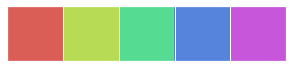

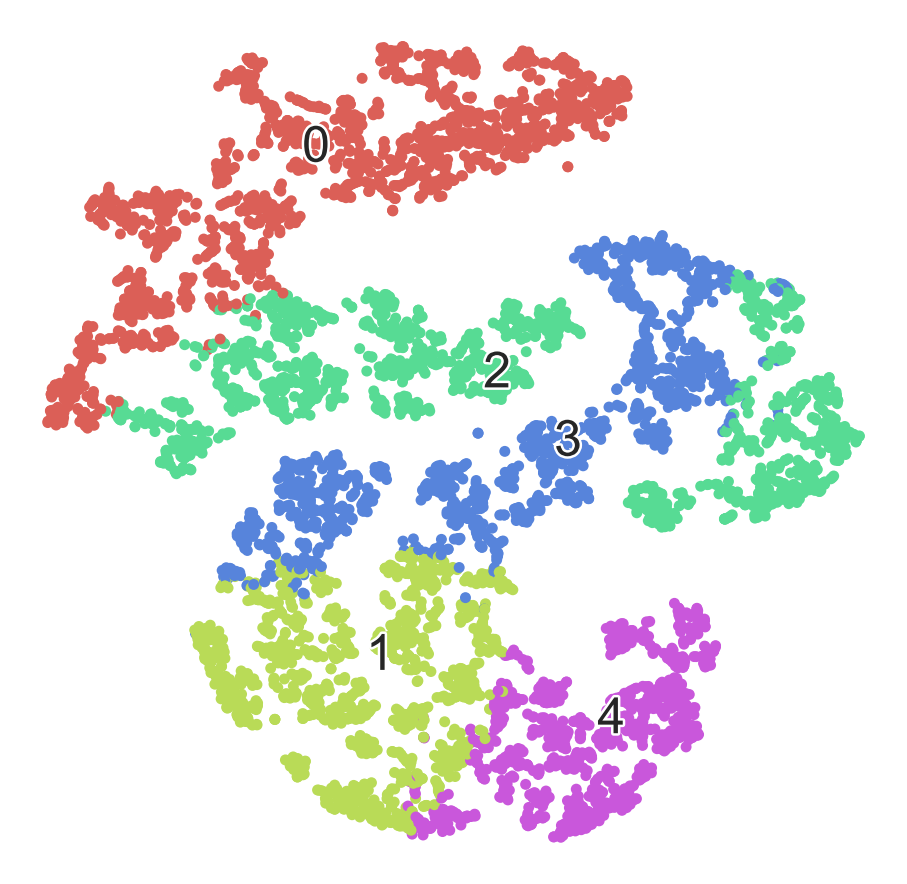

In [35]:
#print(list(range(0,18)));
sns.palplot(np.array(sns.color_palette("hls", k)))
scatter(digits_proj, labels);
# plt.savefig(f'digits_tsne-generated_{k}_cluster.png', dpi=300)  # as per decided K value

In [36]:
from sklearn.manifold import TSNE
import plotly
plotly.offline.init_notebook_mode (connected = True)
# TNSE Analysis
tsne = TSNE(n_components=3,random_state=240, verbose=10, perplexity=500, n_iter=300,n_jobs=-1)
tsne= tsne.fit_transform(data_encoded[0:frame])

c:\Users\yadav\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\yadav\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 1501 nearest neighbors...
[t-SNE] Indexed 7807 samples in 0.008s...
[t-SNE] Computed neighbors for 7807 samples in 1.688s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7807
[t-SNE] Computed conditional probabilities for sample 2000 / 7807
[t-SNE] Computed conditional probabilities for sample 3000 / 7807
[t-SNE] Computed conditional probabilities for sample 4000 / 7807
[t-SNE] Computed conditional probabilities for sample 5000 / 7807
[t-SNE] Computed conditional probabilities for sample 6000 / 7807
[t-SNE] Computed conditional probabilities for sample 7000 / 7807
[t-SNE] Computed conditional probabilities for sample 7807 / 7807
[t-SNE] Mean sigma: 132.469806
[t-SNE] Computed conditional probabilities in 9.648s
[t-SNE] Iteration 50: error = 60.1911011, gradient norm = 0.0139074 (50 iterations in 9.664s)
[t-SNE] Iteration 100: error = 49.7917976, gradient norm = 0.0009405 (50 iterations in 8.928s)
[t-SNE] Iteration 150: error = 49.4986572, gradient norm

In [37]:
# TSNE with clustering Labels
import plotly.express as px
d = {"1":tsne[:,0], "2":tsne[:,1],"3":tsne[:,2]}
dt = pd.DataFrame(d, columns=["1","2","3"])
# labels=kmeanModel.labels_
dt['Labels'] = kmeanModel.labels_.astype(str)
fig = plt.figure(figsize = (50,50))
fig = px.scatter_3d(dt,"1","2","3", color='Labels')
fig.show()

<Figure size 3600x3600 with 0 Axes>

# **Statistics**

--------------------------------------------------------------------------------



                        Results for Non_Behavioural Features                              



--------------------------------------------------------------------------------




The Shape of the data including the Label column is:

(7807, 56)


*******************************************************************************

The Results for the Non_Behavioural Cluster 2 is described as follows... 

*******************************************************************************




The Non_Behavioural features Cluster 2 dataframe size is as Follows...


(1516, 55)




  Non_Behavioural_Cluster_2_Features  Feature_Importance_2  Entity  \
0                                sex              0.579687     1.0   
1                            Country              0.055844    71.0   
2                         isneutered              0.018493     0.0   
3                           birthday              0.017903  21

C:\Users\yadav\AppData\Local\Temp\ipykernel_24472\1543560886.py:105: UserWarning:

FixedFormatter should only be used together with FixedLocator



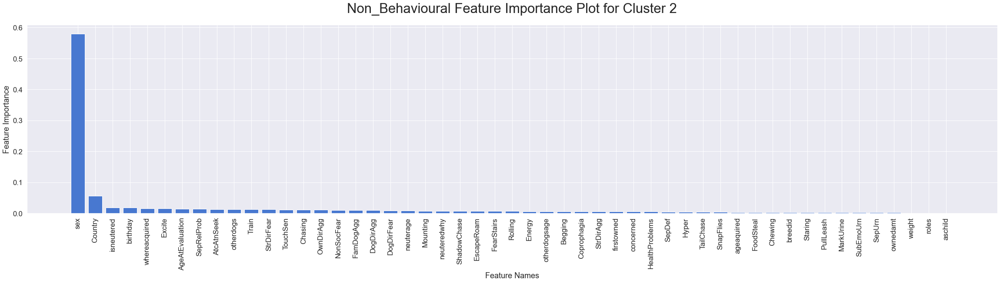





*******************************************************************************

The Results for the Non_Behavioural Cluster 3 is described as follows... 

*******************************************************************************




The Non_Behavioural features Cluster 3 dataframe size is as Follows...


(1385, 55)




  Non_Behavioural_Cluster_3_Features  Feature_Importance_3  Entity  \
0                                sex              0.597590     0.0   
1                            Country              0.057808    71.0   
2                         isneutered              0.019537     0.0   
3                           birthday              0.016661  1440.0   
4                      whereacquired              0.016340     1.0   

   Count_of_Occurance  
0                 702  
1                1001  
2                1385  
3                  13  
4                 520  




The Descriptive Statistics for All Non_Behavioural Features for Cluster_3

       Feature_Importanc

C:\Users\yadav\AppData\Local\Temp\ipykernel_24472\1543560886.py:105: UserWarning:

FixedFormatter should only be used together with FixedLocator



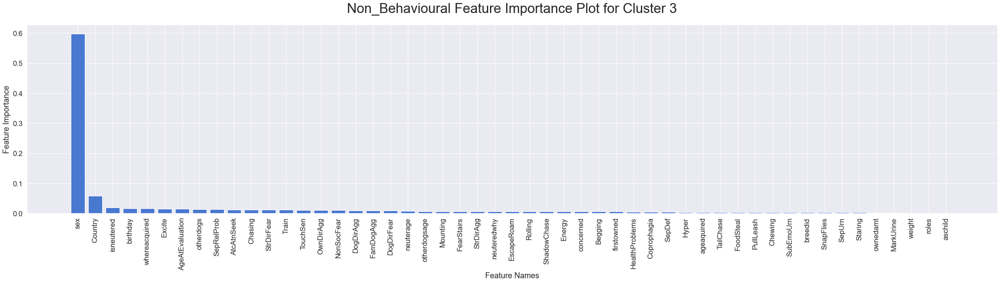





*******************************************************************************

The Results for the Non_Behavioural Cluster 4 is described as follows... 

*******************************************************************************




The Non_Behavioural features Cluster 4 dataframe size is as Follows...


(1820, 55)




  Non_Behavioural_Cluster_4_Features  Feature_Importance_4  Entity  \
0                                sex              0.597596     1.0   
1                            Country              0.106676    71.0   
2                         isneutered              0.019149     0.0   
3                           birthday              0.014776  2839.0   
4                      whereacquired              0.013434     1.0   

   Count_of_Occurance  
0                 947  
1                1287  
2                1820  
3                  72  
4                 729  




The Descriptive Statistics for All Non_Behavioural Features for Cluster_4

       Feature_Importanc

C:\Users\yadav\AppData\Local\Temp\ipykernel_24472\1543560886.py:105: UserWarning:

FixedFormatter should only be used together with FixedLocator



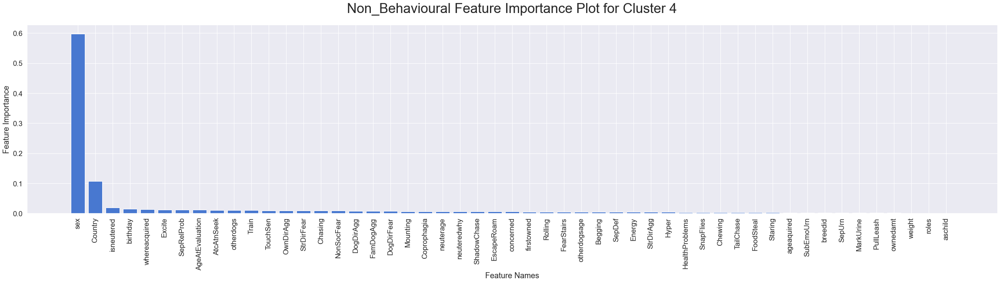





*******************************************************************************

The Results for the Non_Behavioural Cluster 0 is described as follows... 

*******************************************************************************




The Non_Behavioural features Cluster 0 dataframe size is as Follows...


(2032, 55)




  Non_Behavioural_Cluster_0_Features  Feature_Importance_0  Entity  \
0                                sex              0.652966     1.0   
1                            Country              0.164661    71.0   
2                          otherdogs              0.015268     0.0   
3                         isneutered              0.012935     0.0   
4                            Chasing              0.011796     2.5   

   Count_of_Occurance  
0                1037  
1                1547  
2                2032  
3                2032  
4                 183  




The Descriptive Statistics for All Non_Behavioural Features for Cluster_0

       Feature_Importanc

C:\Users\yadav\AppData\Local\Temp\ipykernel_24472\1543560886.py:105: UserWarning:

FixedFormatter should only be used together with FixedLocator



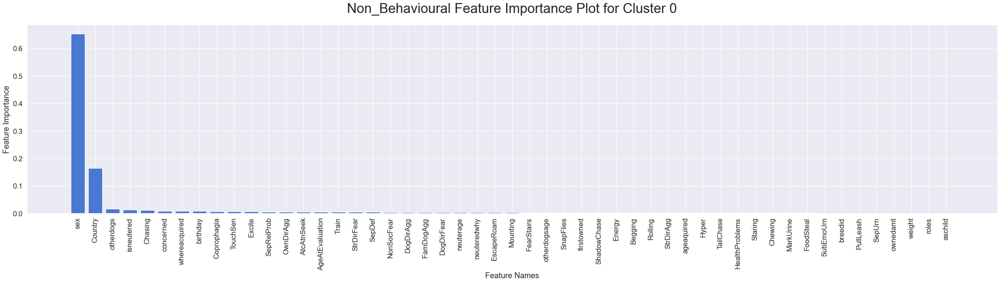





*******************************************************************************

The Results for the Non_Behavioural Cluster 1 is described as follows... 

*******************************************************************************




The Non_Behavioural features Cluster 1 dataframe size is as Follows...


(1054, 55)




  Non_Behavioural_Cluster_1_Features  Feature_Importance_1  Entity  \
0                                sex              0.666145     0.0   
1                            Country              0.130004    71.0   
2                          otherdogs              0.017887     0.0   
3                         isneutered              0.015489     0.0   
4                      whereacquired              0.012180     1.0   

   Count_of_Occurance  
0                 593  
1                 788  
2                1054  
3                1054  
4                 389  




The Descriptive Statistics for All Non_Behavioural Features for Cluster_1

       Feature_Importanc

C:\Users\yadav\AppData\Local\Temp\ipykernel_24472\1543560886.py:105: UserWarning:

FixedFormatter should only be used together with FixedLocator



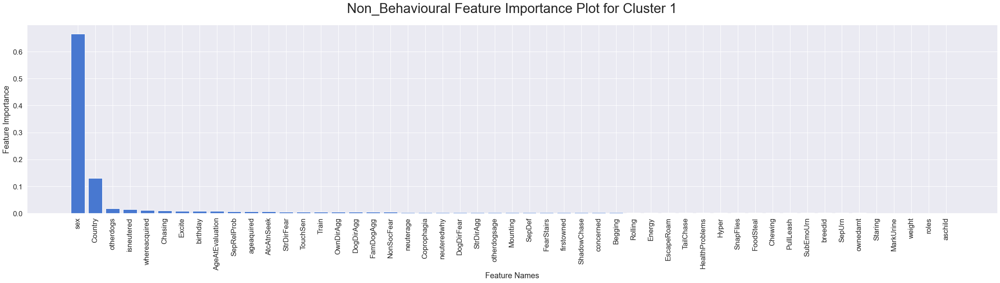

In [38]:
from sklearn.ensemble import RandomForestClassifier
from turtle import left

# group = ['Behavioural', 'Non_Behavioural', 'All_Canine']
group = ['Non_Behavioural']
for gp in group:
    # read the file
    data = pd.read_csv(rf"C:\Users\yadav\Documents\DogAvtarProject\Behavioral data\Labeled_{gp}_data.csv", encoding='latin-1');

    print('--------------------------------------------------------------------------------\n')
    print('\n')
    print(f'                        Results for {gp} Features                              \n')
    print('\n')
    print('--------------------------------------------------------------------------------\n')
    print('\n\n')
    print('The Shape of the data including the Label column is:\n')
    print(data.shape)
    print('\n')
    
    
    # df = data
    cols = data.columns
    pandas_dataframes = []
    descriptive_Stats = []
    for cl in data.Label.unique():
        
        #generate the per label data frame
        data2 = data[data['Label'] == cl]
        data1 = data2.drop(['Label'], axis=1)
        # data1.to_csv(f'Dataframe of {gp} Featurs Cluster {cl}.csv', encoding='utf-8', index= False)
        
        # Descriptive Statistics
        # print(data1.describe())
        Descriptives = data1.describe().transpose()
        # Descriptives.to_csv(f'Descriptive Sttistics for {gp} Featurs Cluster {cl}.csv', encoding='utf-8', index= True)

        # Priting the results in single cell
        print('*******************************************************************************\n')
        print(f'The Results for the {gp} Cluster {cl} is described as follows... \n')
        print('*******************************************************************************\n\n\n\n')

        print(f'The {gp} features Cluster {cl} dataframe size is as Follows...\n\n')
        print(data1.shape) 
        print('\n\n\n')

        columnName = []
        countItem = []
        maxcount = []
        cols = data1.columns
        for cls in cols:
            # print(data[cl].value_counts())
            ab = data2[cls].value_counts()
            na = ab.idxmax()
            num = ab.loc[ab.idxmax()]
            columnName.append(cls)
            countItem.append(na)
            maxcount.append(num)
        Dframe = {f'{gp}_Feature_Cluster_{cl}':columnName,'Entity':countItem,'Count_of_Occurance':maxcount}
        Max_count_from_features = pd.DataFrame(Dframe)

        custom_target = data.Label.copy()
        custom_target.loc[custom_target != cl] = -1
        custom_target.loc[custom_target == cl] = 1
        clf = RandomForestClassifier(100 , random_state = 42)
        clf.fit(data.values[: , 1:-4], custom_target)
        imps , features = zip(*sorted(zip(clf.feature_importances_, data.columns) , reverse = True))  
        # initialize data of lists.
        ImpFeatures = {f'{gp}_Cluster_{cl}_Features': features, f'Feature_Importance_{cl}': imps}
        imp = pd.DataFrame(ImpFeatures)
        #pandas_dataframes.append(imp)

        # # merging the stats from both dataframes
        dff = imp.merge(Max_count_from_features, left_on= f'{gp}_Cluster_{cl}_Features', right_on= f'{gp}_Feature_Cluster_{cl}', how='inner')
        dff1 = dff.drop(f'{gp}_Feature_Cluster_{cl}', axis=1)
        print(dff1.head())
        # dff1.to_csv(f'Count and Feature Importance Stats for {gp} Feature Cluster {cl}.csv', encoding='utf-8', index= False)

        print('\n\n\n')
        # print the descriptive statistics of clusters
        print(f'The Descriptive Statistics for All {gp} Features for Cluster_{cl}\n')
        print(imp.describe())
        # Descriptives = imp.describe()
        # descriptive_Stats.append(Descriptives)

        # print top 20 attributes descriptive statistics
        print(f'\n\nThe Top-20 {gp} Features of Cluster {cl} is as follows...\n')
        print(imp[:20])
        lst = imp[:20]
        print(f'\n\nThe Descriptive Statistics for Top-20 {gp} Features of Cluster {cl} is as follows...\n')
        kg=imp[f'Feature_Importance_{cl}'][:20]
        print(kg.describe())
        # lst.to_csv(f'Top-20 attributes dataframe of {gp} Featurs Cluster {cl}.csv', encoding='utf-8', index= False)

        # print(f'feature impotratance for the cluster : {cl} \n')
        # # pd.set_option('display.max_rows', None)
        # print(imp)
        
        print('*******************************************************************************\n')
        print(f'The Feature Importance for the {gp} Cluster {cl} ... \n')
        print('*******************************************************************************\n')
        # Plot
        plt.figure(figsize=(40, 8))
        ax = plt.bar(features,  imps)
        ax = plt.gca()
        ax.set_xticklabels(labels=features,rotation=90);
        ax.set_xlabel('Feature Names')
        ax.set_ylabel('Feature Importance')
        ax.set_title(f"{gp} Feature Importance Plot for Cluster {cl}", fontsize='xx-large', y=1.05)
        # plt.savefig(f'Feature Importance Plot for Cluster {cl}.jpg', dpi=600, bbox_inches='tight')
        plt.show()
        print('\n\n\n')

# **Correlation Matrixs**

--------------------------------------------------------------------------------



                        Results for Non_Behavioural Features                              



--------------------------------------------------------------------------------




The Shape of the data including the Label column is:

(7807, 56)


*******************************************************************************

The Correlatoin Matrix for the Non_Behavioural Cluster 2 ... 

*******************************************************************************





*******************************************************************************

The Correlatoin Matrix for the Non_Behavioural Cluster 3 ... 

*******************************************************************************





*******************************************************************************

The Correlatoin Matrix for the Non_Behavioural Cluster 4 ... 

********************************************************************

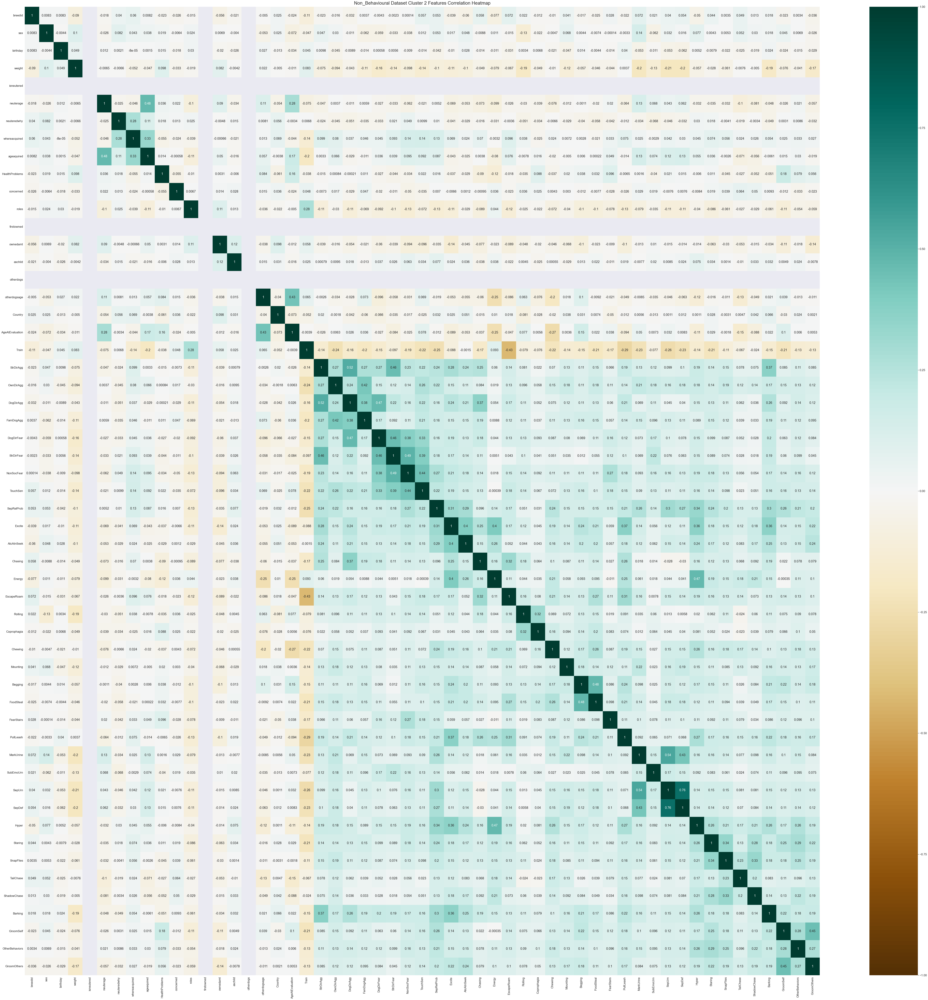

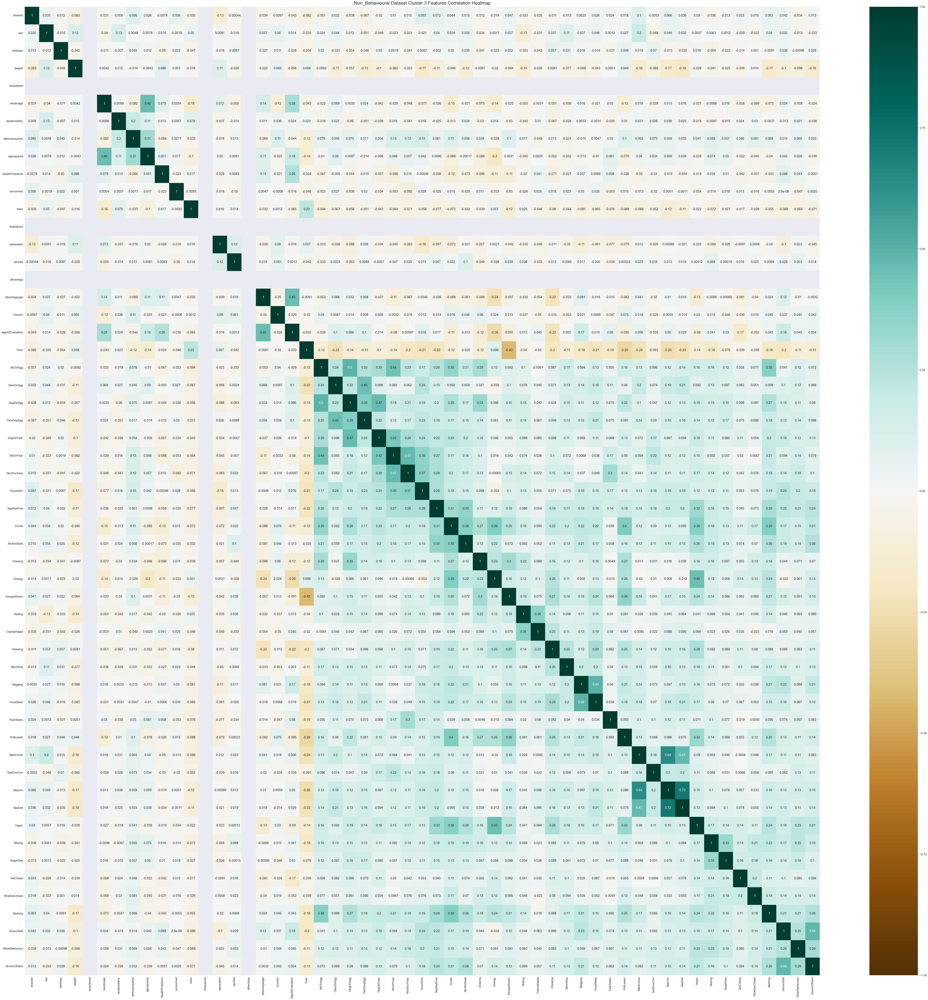

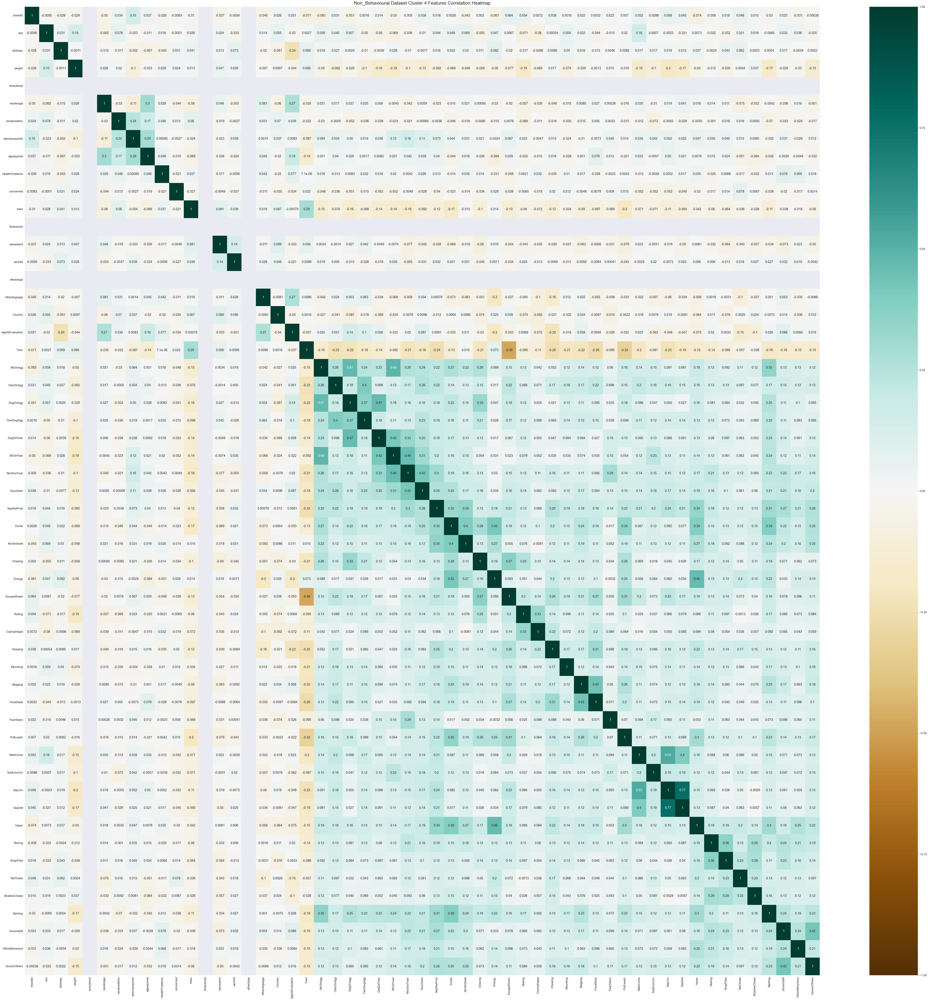

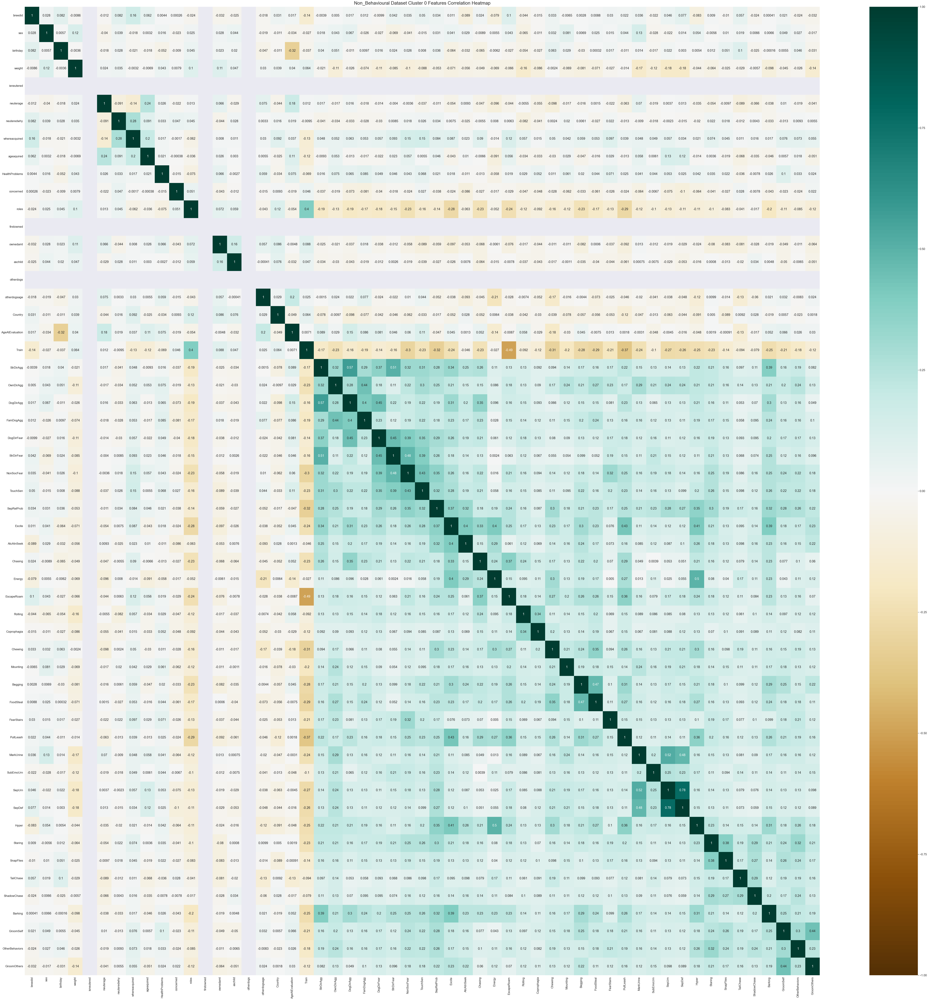

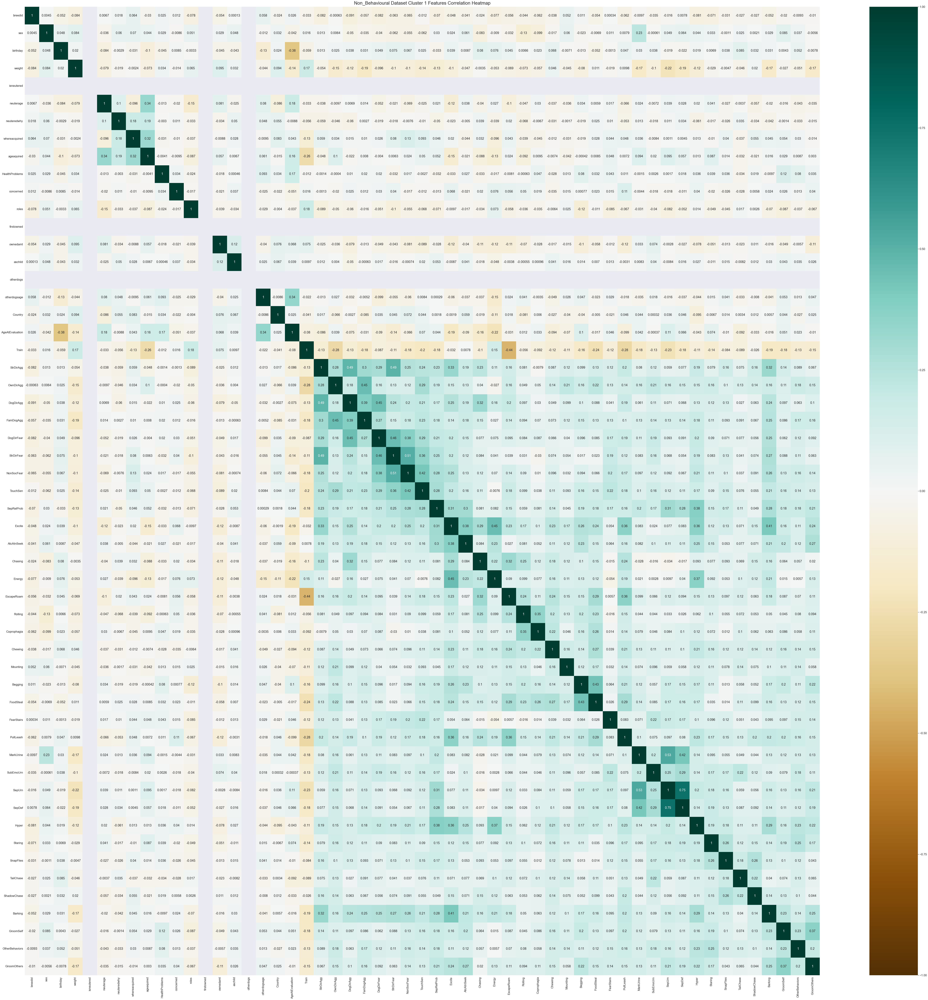

In [39]:
from sklearn.ensemble import RandomForestClassifier
from turtle import left

# group = ['Behavioural', 'Non_Behavioural', 'All_Canine']
group = ['Non_Behavioural']
for gp in group:
    # read the file
    data = pd.read_csv(rf"C:\Users\yadav\Documents\DogAvtarProject\Behavioral data\Labeled_{gp}_data.csv", encoding='latin-1');

    print('--------------------------------------------------------------------------------\n')
    print('\n')
    print(f'                        Results for {gp} Features                              \n')
    print('\n')
    print('--------------------------------------------------------------------------------\n')
    print('\n\n')
    print('The Shape of the data including the Label column is:\n')
    print(data.shape)
    print('\n')
    
    
    # df = data
    cols = data.columns
    pandas_dataframes = []
    descriptive_Stats = []
    for cl in data.Label.unique():
        # generate the per label data frame
        data2 = data[data['Label'] == cl]
        data1 = data2.drop(['Label'], axis=1)
        # data1.to_csv(f'Dataframe of {gp} Featurs Cluster {cl}.csv', encoding='utf-8', index= False)
        
        print('*******************************************************************************\n')
        print(f'The Correlatoin Matrix for the {gp} Cluster {cl} ... \n')
        print('*******************************************************************************\n')
        # Increase the size of the heatmap.
        plt.figure(figsize=(100, 100))
        heatmap = sns.heatmap(data1.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
        heatmap.set_title(f'{gp} Dataset Cluster {cl} Features Correlation Heatmap', fontdict={'fontsize':26}, pad=12)
        # # plt.savefig(f'{gp} Dataset Cluster {cl} Features Correlation Heatmap.jpg', dpi=600)
        print('\n\n\n')

# **HTML**

In [40]:
# install nbconvert (if facing with conversion error)
!pip3 install nbconvert 

# convert ipynb to html
!jupyter nbconvert --to html Non_behavioural_sheet.ipynb


[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip
[NbConvertApp] Converting notebook Non_behavioural_sheet.ipynb to html
[NbConvertApp] Writing 36449562 bytes to Non_behavioural_sheet.html
